In [1]:
import os

from xcube.core.store import new_data_store
from xcube.core.maskset import MaskSet
import matplotlib.pyplot as plt
import datetime
import numpy as np
import xarray as xr
import utils
import constants
import matplotlib.pyplot as plt

In [2]:
xr.set_options(display_expand_attrs=False)

In [3]:
# greate s3 data store
s3_store = new_data_store(
    "s3",
    root=os.environ["S3_USER_STORAGE_BUCKET"],
    max_depth=10,
    storage_options=dict(
        anon=False,
        key=os.environ["S3_USER_STORAGE_KEY"],
        secret=os.environ["S3_USER_STORAGE_SECRET"],
    ),
)

---
## Plot training data cube

In [23]:
ds = s3_store.open_data("cubes/training/0.1.0/0735_0.zarr")
ds

<xarray.Dataset> Size: 34MB
Dimensions:                   (time: 73, y: 90, x: 90, time_era5: 362,
                               time_lccs: 3, band: 12, angle: 2, angle_y: 23,
                               angle_x: 23)
Coordinates:
  * time                      (time) datetime64[ns] 584B 2017-07-30T10:00:31....
  * y                         (y) float64 720B 4.688e+06 4.688e+06 ... 4.688e+06
  * x                         (x) float64 720B 3.44e+05 3.441e+05 ... 3.449e+05
  * time_era5                 (time_era5) datetime64[ns] 3kB 2017-07-30 ... 2...
  * time_lccs                 (time_lccs) datetime64[ns] 24B 2017-01-01 ... 2...
  * band                      (band) <U3 144B 'B01' 'B02' 'B03' ... 'B11' 'B12'
  * angle                     (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_y                   (angle_y) float64 184B 4.703e+06 ... 4.593e+06
  * angle_x                   (angle_x) float64 184B 3.025e+05 ... 4.125e+05
    spatial_ref               int64 8B ...
Data variables: (12/118)
    cloud_mask                (time, y, x) uint8 591kB dask.array<chunksize=(20, 90, 90), meta=np.ndarray>
    dem                       (y, x) float32 32kB dask.array<chunksize=(90, 90), meta=np.ndarray>
    era5_d2m_max              (time_era5) float32 1kB dask.array<chunksize=(362,), meta=np.ndarray>
    era5_d2m_mean             (time_era5) float32 1kB dask.array<chunksize=(362,), meta=np.ndarray>
    era5_d2m_median           (time_era5) float32 1kB dask.array<chunksize=(362,), meta=np.ndarray>
    era5_d2m_min              (time_era5) float32 1kB dask.array<chunksize=(362,), meta=np.ndarray>
    ...                        ...
    lccs_observation_count    (time_lccs, y, x) uint16 49kB dask.array<chunksize=(3, 90, 90), meta=np.ndarray>
    lccs_processed_flag       (time_lccs, y, x) float32 97kB dask.array<chunksize=(3, 90, 90), meta=np.ndarray>
    s2l2a                     (band, time, y, x) float32 28MB dask.array<chunksize=(12, 20, 90, 90), meta=np.ndarray>
    scl                       (time, y, x) uint8 591kB dask.array<chunksize=(20, 90, 90), meta=np.ndarray>
    solar_angle               (time, angle, angle_y, angle_x) float32 309kB dask.array<chunksize=(20, 2, 23, 23), meta=np.ndarray>
    viewing_angle             (time, angle, band, angle_y, angle_x) float32 4MB dask.array<chunksize=(20, 2, 12, 23, 23), meta=np.ndarray>
Attributes: (24)

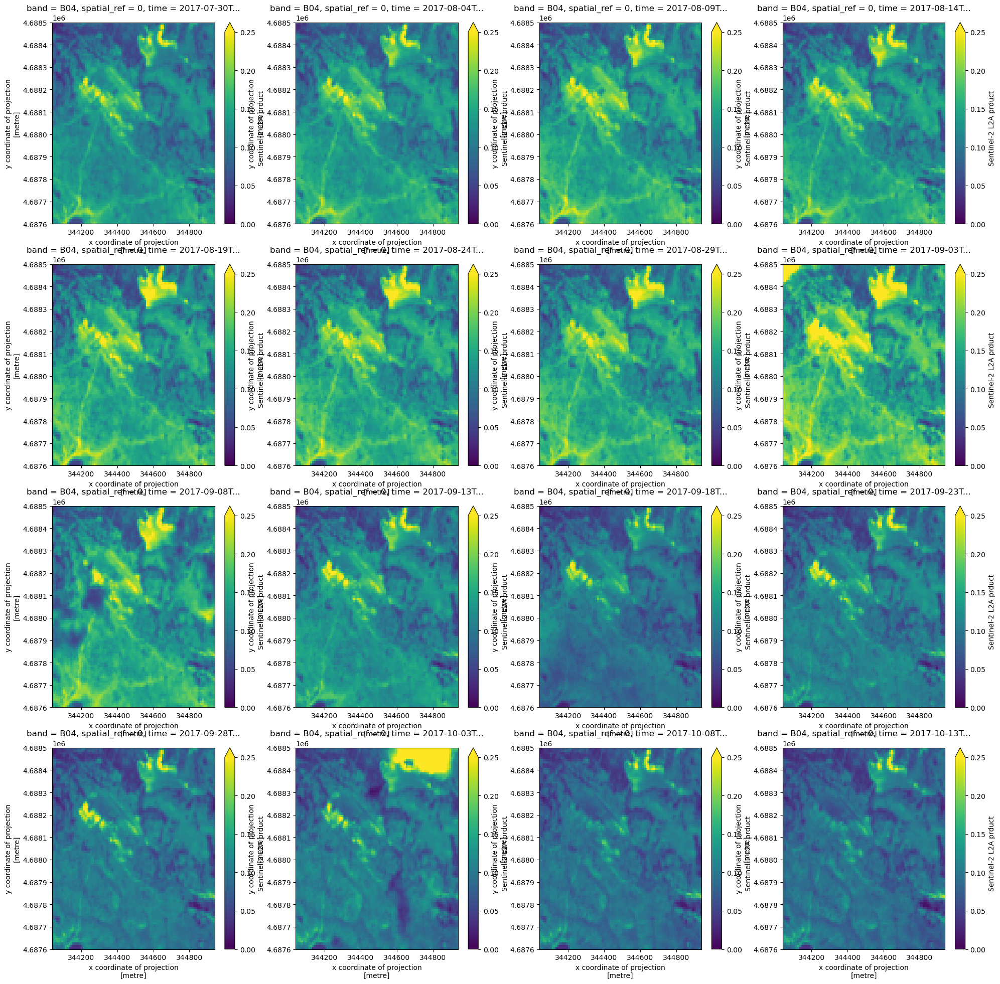

In [25]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.s2l2a.isel(time=i, band=3).plot(ax=ax[i], vmax=0.25, vmin=0.)

In [26]:
cloud_mask_mask = MaskSet(ds.cloud_mask)
cmap, norm = cloud_mask_mask.get_cmap()
cloud_mask_mask

Flag name,Mask,Value
clear,None,0
thick_cloud,None,1
thin_cloud,None,2
cloud_shadow,None,3


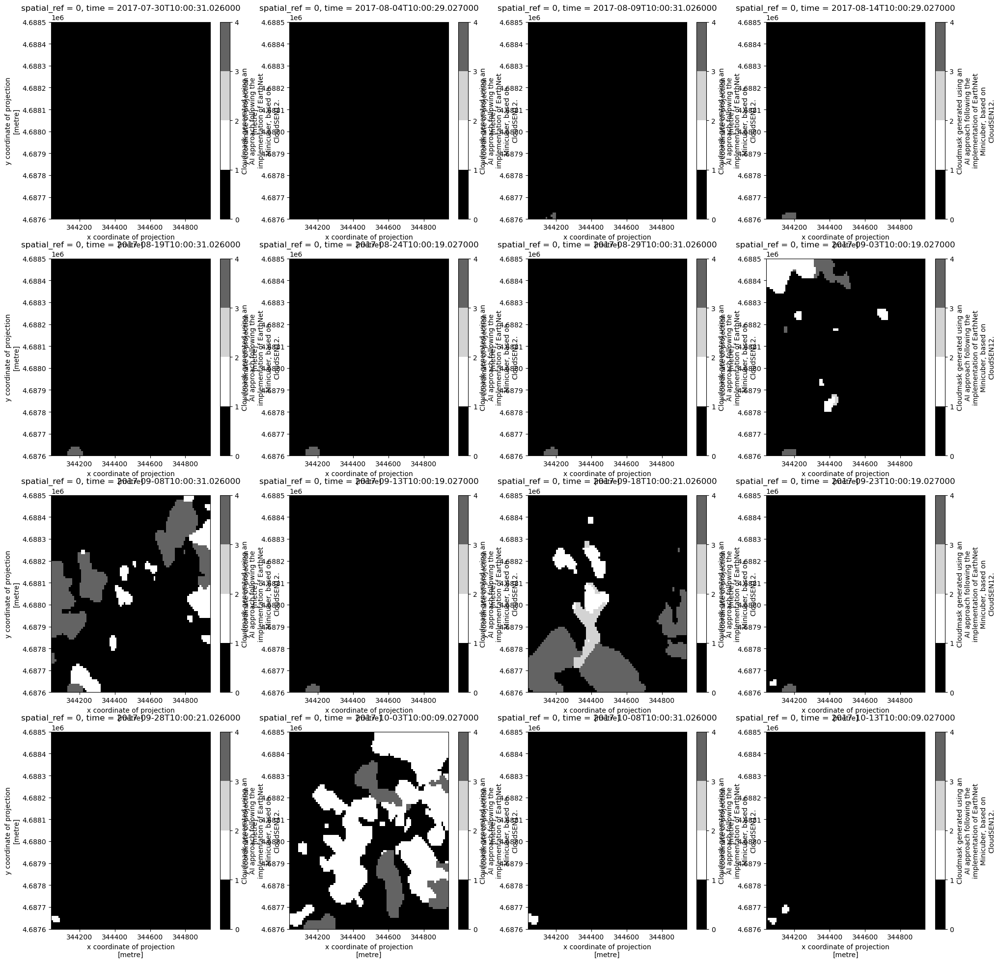

In [27]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.cloud_mask.isel(time=i).plot(ax=ax[i], cmap=cmap, norm=norm)

In [28]:
scl_mask = MaskSet(ds.scl)
cmap, norm = scl_mask.get_cmap()
scl_mask

Flag name,Mask,Value
no_data,None,0
saturated_or_defective_pixel,None,1
topographic_casted_shadows,None,2
cloud_shadows,None,3
vegetation,None,4
not_vegetation,None,5
water,None,6
unclassified,None,7
cloud_medium_probability,None,8
cloud_high_probability,None,9


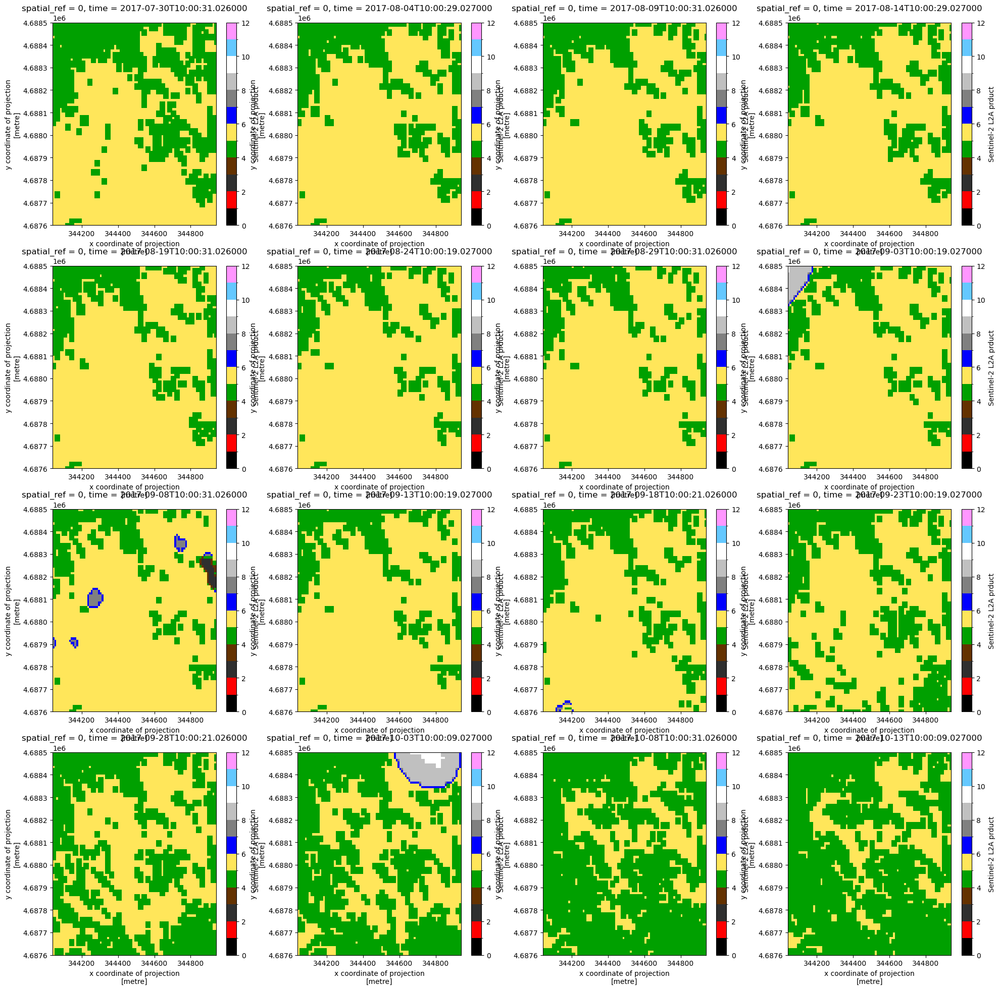

In [29]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.scl.isel(time=i).plot(ax=ax[i], cmap=cmap, norm=norm)

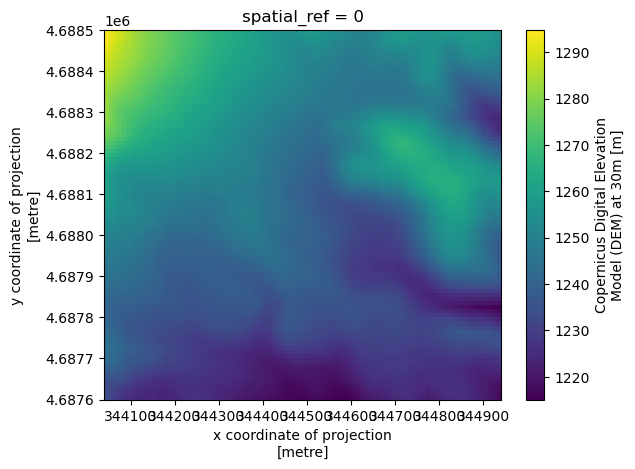

In [30]:
ds.dem.plot()

In [31]:
land_cover = ds.lccs_class
land_cover_mask = MaskSet(land_cover)
land_cover_mask

Flag name,Mask,Value
no_data,None,0
cropland_rainfed,None,10
cropland_rainfed_herbaceous_cover,None,11
cropland_rainfed_tree_or_shrub_cover,None,12
cropland_irrigated,None,20
mosaic_cropland,None,30
mosaic_natural_vegetation,None,40
tree_broadleaved_evergreen_closed_to_open,None,50
tree_broadleaved_deciduous_closed_to_open,None,60
tree_broadleaved_deciduous_closed,None,61


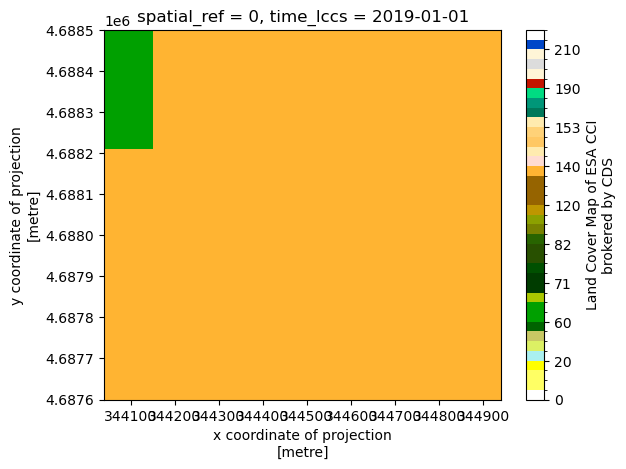

In [32]:
cmap, norm = land_cover_mask.get_cmap()
ds.lccs_class.isel(time_lccs=-1).plot(cmap=cmap, norm=norm)

In [33]:
esa_wc_mask = MaskSet(ds.esa_wc)
cmap, norm = esa_wc_mask.get_cmap()
esa_wc_mask

Flag name,Mask,Value
tree_cover,None,10
shrubland,None,20
grassland,None,30
cropland,None,40
built_up,None,50
bare_sparse_vegetation,None,60
snow_and_ice,None,70
permanent_water_bodies,None,80
herbaceous_wetland,None,90
mangroves,None,95


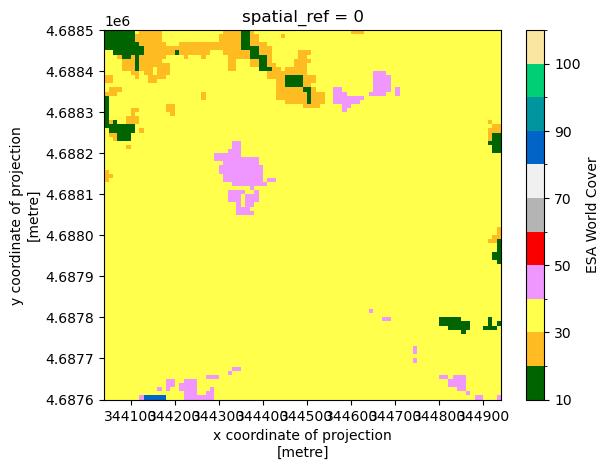

In [34]:
cmap, norm = esa_wc_mask.get_cmap()
ds.esa_wc.plot(cmap=cmap, norm=norm)

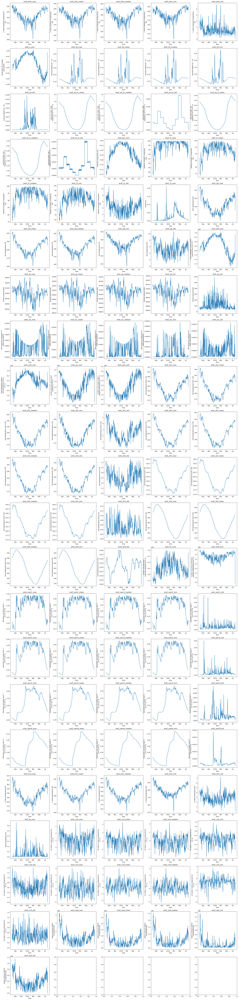

In [35]:
fig, _ax = plt.subplots(22, 5, figsize=(6*5, 6*22))
ax = _ax.flatten()
era5_vars = [var for var in ds.data_vars if "era5" in var]
for i, var in enumerate(era5_vars):
    ds[var].plot(ax=ax[i])
    ax[i].set_title(var)

---
## 1. Science cube

In [36]:
ds = s3_store.open_data("cubes/science/0.1.0/000.zarr")
ds

<xarray.Dataset> Size: 58GB
Dimensions:                   (time: 1150, y: 1000, x: 1000, time_era5: 2983,
                               time_lccs: 7, band: 12, angle: 2, angle_y: 2,
                               angle_x: 2)
Coordinates:
  * time                      (time) datetime64[ns] 9kB 2016-11-04T10:42:22.0...
  * y                         (y) float64 8kB 5.656e+06 5.656e+06 ... 5.646e+06
  * x                         (x) float64 8kB 6.797e+05 6.798e+05 ... 6.897e+05
  * time_era5                 (time_era5) datetime64[ns] 24kB 2016-11-01 ... ...
  * time_lccs                 (time_lccs) datetime64[ns] 56B 2016-01-01 ... 2...
  * band                      (band) <U5 240B 'B01' 'B02' 'B03' ... 'B11' 'B12'
  * angle                     (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_y                   (angle_y) float64 16B 5.651e+06 5.646e+06
  * angle_x                   (angle_x) float64 16B 6.797e+05 6.847e+05
    spatial_ref               int64 8B ...
Data variables: (12/118)
    cloud_mask                (time, y, x) uint8 1GB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    dem                       (y, x) float32 4MB dask.array<chunksize=(500, 500), meta=np.ndarray>
    era5_d2m_max              (time_era5) float32 12kB dask.array<chunksize=(2983,), meta=np.ndarray>
    era5_d2m_mean             (time_era5) float32 12kB dask.array<chunksize=(2983,), meta=np.ndarray>
    era5_d2m_median           (time_era5) float32 12kB dask.array<chunksize=(2983,), meta=np.ndarray>
    era5_d2m_min              (time_era5) float32 12kB dask.array<chunksize=(2983,), meta=np.ndarray>
    ...                        ...
    lccs_observation_count    (time_lccs, y, x) uint16 14MB dask.array<chunksize=(7, 500, 500), meta=np.ndarray>
    lccs_processed_flag       (time_lccs, y, x) float32 28MB dask.array<chunksize=(7, 500, 500), meta=np.ndarray>
    s2l2a                     (band, time, y, x) float32 55GB dask.array<chunksize=(12, 1, 500, 500), meta=np.ndarray>
    scl                       (time, y, x) uint8 1GB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    solar_angle               (time, angle, angle_y, angle_x) float32 37kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle             (time, angle, band, angle_y, angle_x) float32 442kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (24)

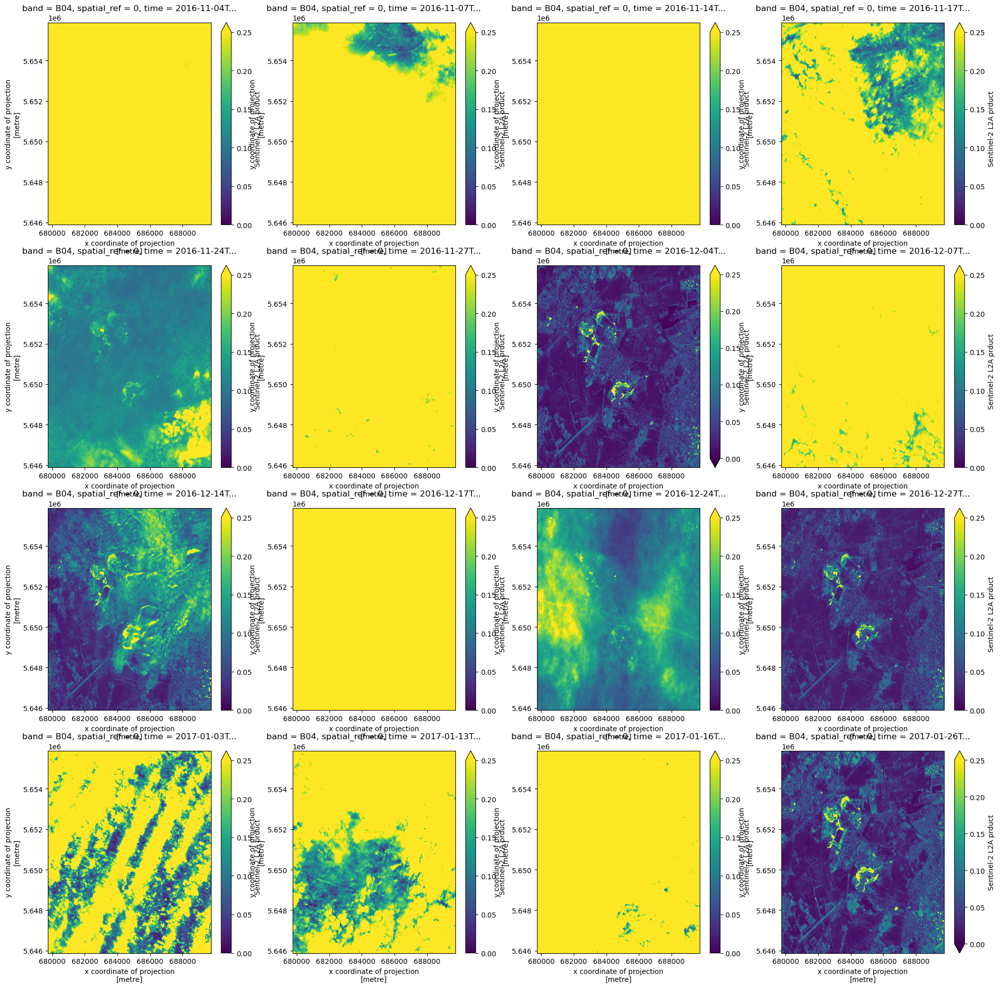

In [38]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.s2l2a.isel(time=i, band=3).plot(ax=ax[i], vmax=0.25, vmin=0.)

In [39]:
cloud_mask_mask = MaskSet(ds.cloud_mask)
cmap, norm = cloud_mask_mask.get_cmap()
cloud_mask_mask

Flag name,Mask,Value
clear,None,0
thick_cloud,None,1
thin_cloud,None,2
cloud_shadow,None,3


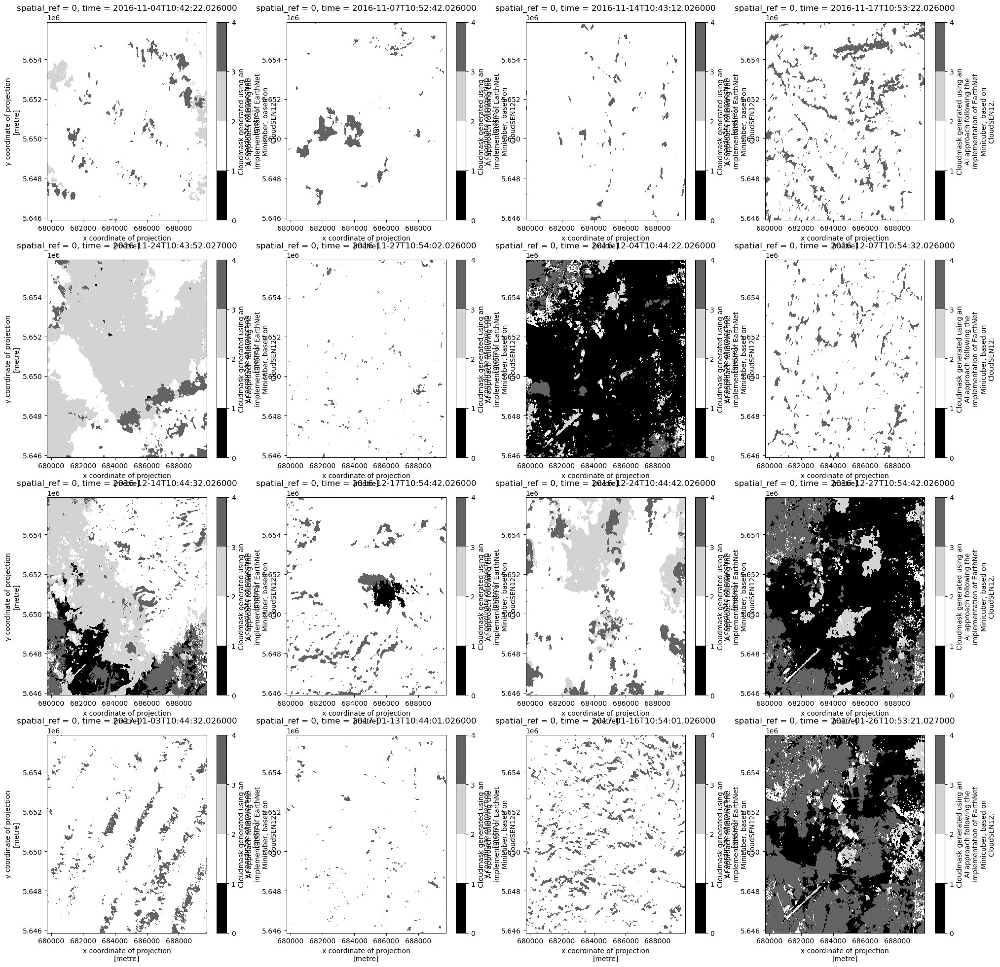

In [40]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.cloud_mask.isel(time=i).plot(ax=ax[i], cmap=cmap, norm=norm)

In [41]:
scl_mask = MaskSet(ds.scl)
cmap, norm = scl_mask.get_cmap()
scl_mask

Flag name,Mask,Value
no_data,None,0
saturated_or_defective_pixel,None,1
topographic_casted_shadows,None,2
cloud_shadows,None,3
vegetation,None,4
not_vegetation,None,5
water,None,6
unclassified,None,7
cloud_medium_probability,None,8
cloud_high_probability,None,9


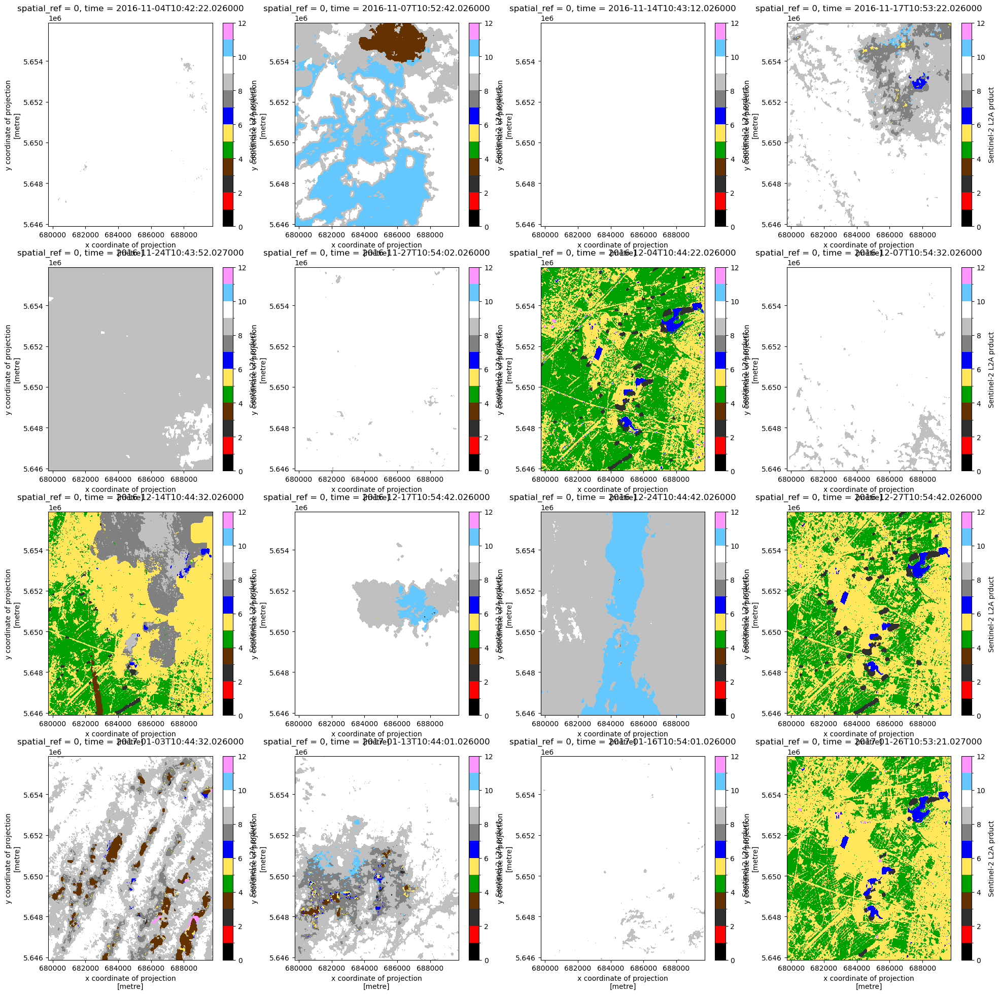

In [42]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.scl.isel(time=i).plot(ax=ax[i], cmap=cmap, norm=norm)

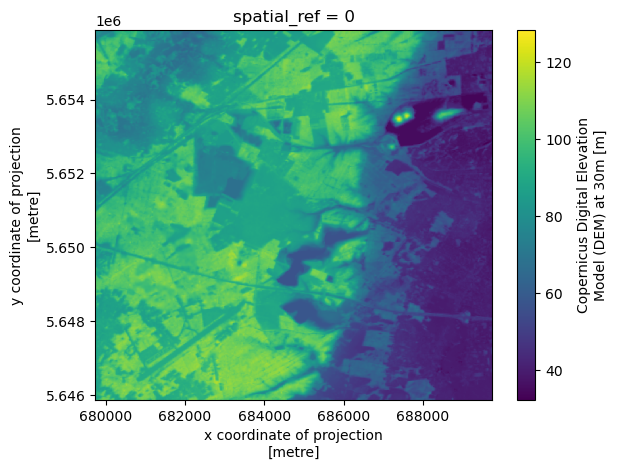

In [43]:
ds.dem.plot()

In [44]:
land_cover_mask = MaskSet(ds.lccs_class)
land_cover_mask

Flag name,Mask,Value
no_data,None,0
cropland_rainfed,None,10
cropland_rainfed_herbaceous_cover,None,11
cropland_rainfed_tree_or_shrub_cover,None,12
cropland_irrigated,None,20
mosaic_cropland,None,30
mosaic_natural_vegetation,None,40
tree_broadleaved_evergreen_closed_to_open,None,50
tree_broadleaved_deciduous_closed_to_open,None,60
tree_broadleaved_deciduous_closed,None,61


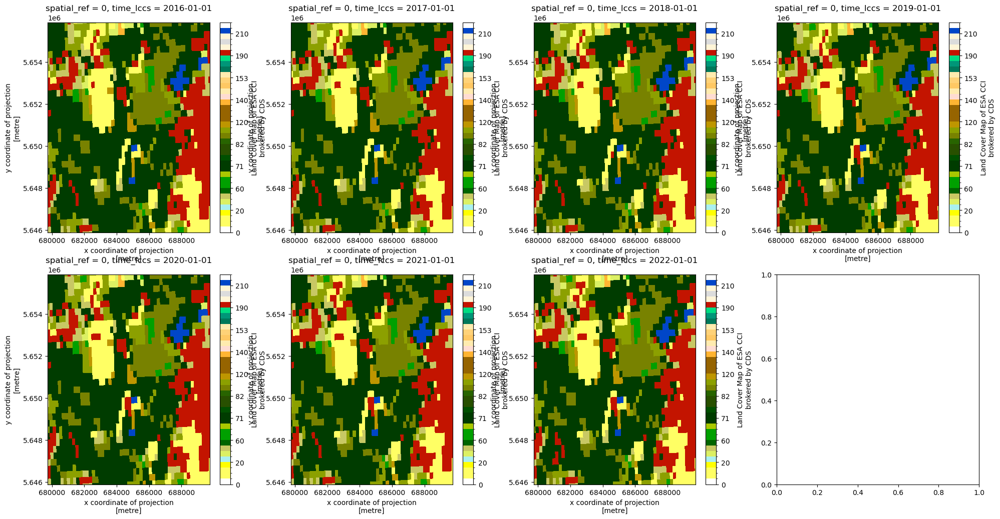

In [46]:
cmap, norm = land_cover_mask.get_cmap()
fig, _ax = plt.subplots(2, 4, figsize=(6*4, 6*2))
ax = _ax.flatten()
for i in range(7):
    ds.lccs_class.isel(time_lccs=i).plot(ax=ax[i], cmap=cmap, norm=norm)

In [47]:
esa_wc_mask = MaskSet(ds.esa_wc)
cmap, norm = esa_wc_mask.get_cmap()
esa_wc_mask

Flag name,Mask,Value
tree_cover,None,10
shrubland,None,20
grassland,None,30
cropland,None,40
built_up,None,50
bare_sparse_vegetation,None,60
snow_and_ice,None,70
permanent_water_bodies,None,80
herbaceous_wetland,None,90
mangroves,None,95


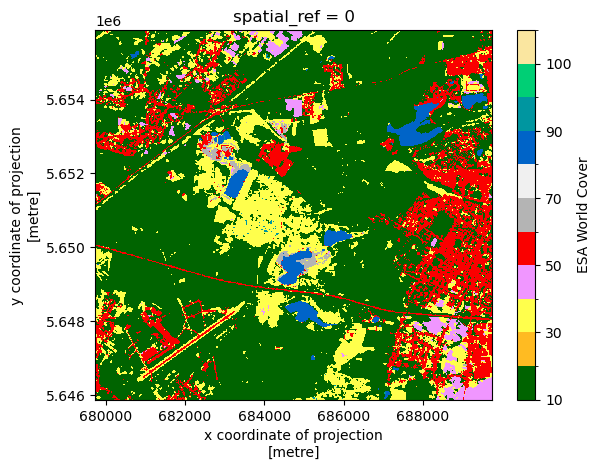

In [48]:
cmap, norm = esa_wc_mask.get_cmap()
ds.esa_wc.plot(cmap=cmap, norm=norm)

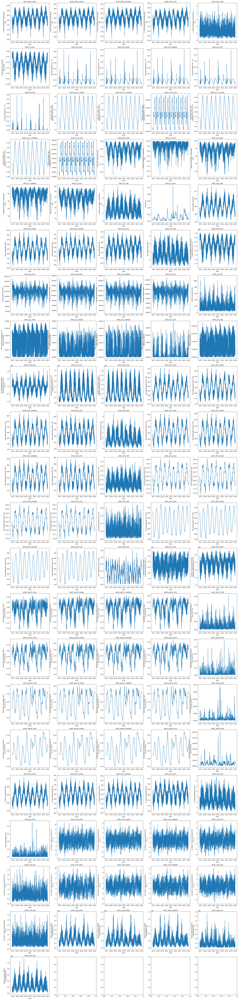

In [49]:
fig, _ax = plt.subplots(22, 5, figsize=(6*5, 6*22))
ax = _ax.flatten()
era5_vars = [var for var in ds.data_vars if "era5" in var]
for i, var in enumerate(era5_vars):
    ds[var].plot(ax=ax[i])
    ax[i].set_title(var)